**Artificial Intelligence Course - Final Exam**<br>
**Random Forest**<br>
**Student - Avgustin Chynarbekov**<br>
**Group - COM20**

About the data: Let’s consider a Company dataset with around 11 variables and more than 400 records.

Problem Statement: A cloth manufacturing company is interested to know about the segment or attributes causes high sale. Approach - A Random Forest needs to be built with target variable Sale. The attributes are as follows:
<ol>
<li>Sales - Unit sales (in thousands) at each location</li>
<li>Competitor Price - Price charged by competitor at each location</li>
<li>Income - Community income level (in thousands of dollars)</li>
<li>Advertising - Local advertising budget for company at each location (in thousands of dollars)</li>
<li>Population - Population size in region (in thousands)</li>
<li>Price - Price company charges for car seats at each site Shelf Location at stores</li>
<li>Shelving location - A factor with levels Bad, Good and Medium indicating the quality of the shelving location for the car seats at each site</li>
<li>Age - Average age of the local population</li>
<li>Education – Education level at each location</li>
<li>Urban - A factor with levels No and Yes to indicate whether the store is in an urban or rural location</li>
<li>US - A factor with levels No and Yes to indicate whether the store is in the US or not</li>
</ol>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import plot_tree

In [50]:
import pandas as pd
features = pd.read_csv('generated_data.csv')
features.head(15)

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,11.6,179,85,14,100,60,Good,30,14,Yes,No
1,5.3,140,63,12,402,172,Bad,31,14,No,No
2,11.9,140,34,10,219,120,Bad,29,9,Yes,No
3,7.2,101,26,19,473,188,Good,35,16,No,Yes
4,18.4,155,22,19,391,154,Bad,25,8,No,No
5,18.4,143,22,7,368,92,Medium,27,15,Yes,Yes
6,20.2,132,57,6,150,161,Bad,40,13,Yes,No
7,21.7,117,46,19,240,135,Medium,59,15,Yes,Yes
8,22.5,125,26,9,438,74,Good,59,13,Yes,Yes
9,13.3,185,95,2,347,70,Good,57,15,Yes,No


In [5]:
features.info(verbose = True,show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


In [51]:
print('The number of rows and columns of our DataFrame:', features.shape)

The number of rows and columns of our DataFrame: (400, 11)


In [7]:
features.isnull().any()

Sales          False
CompPrice      False
Income         False
Advertising    False
Population     False
Price          False
ShelveLoc      False
Age            False
Education      False
Urban          False
US             False
dtype: bool

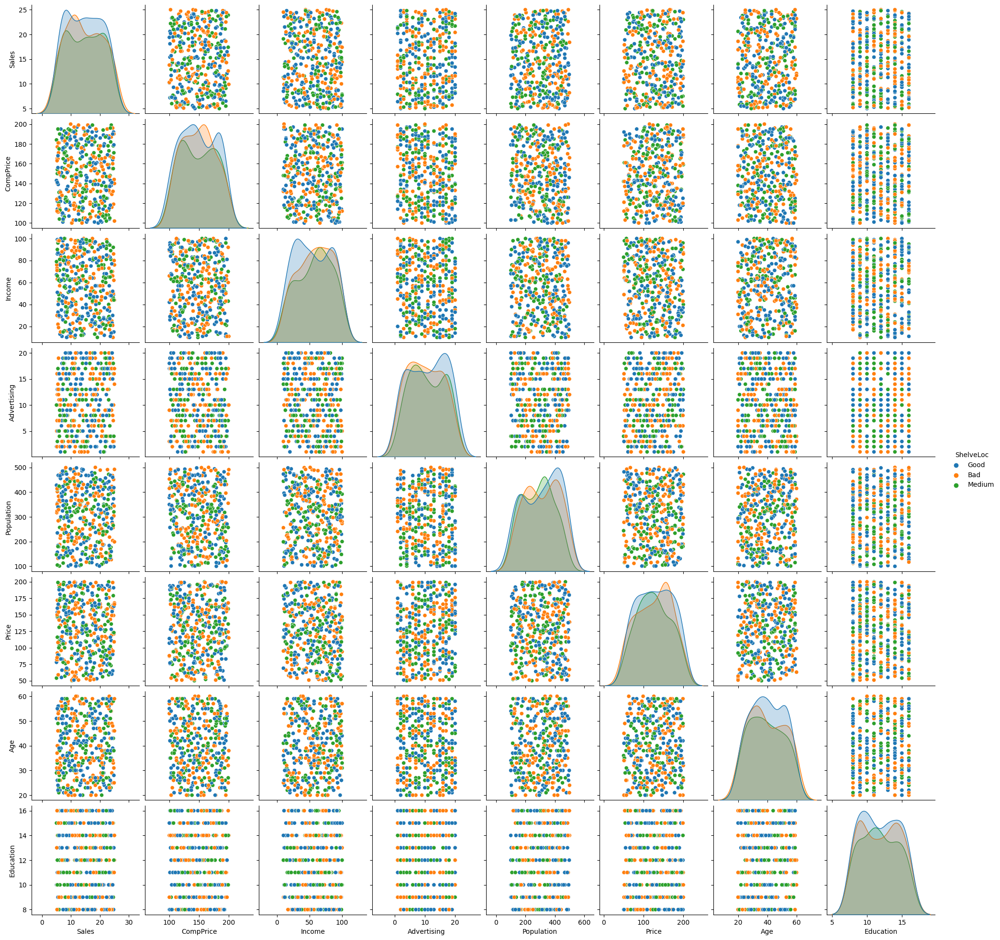

In [18]:
sns.pairplot(data=features, hue = 'ShelveLoc')

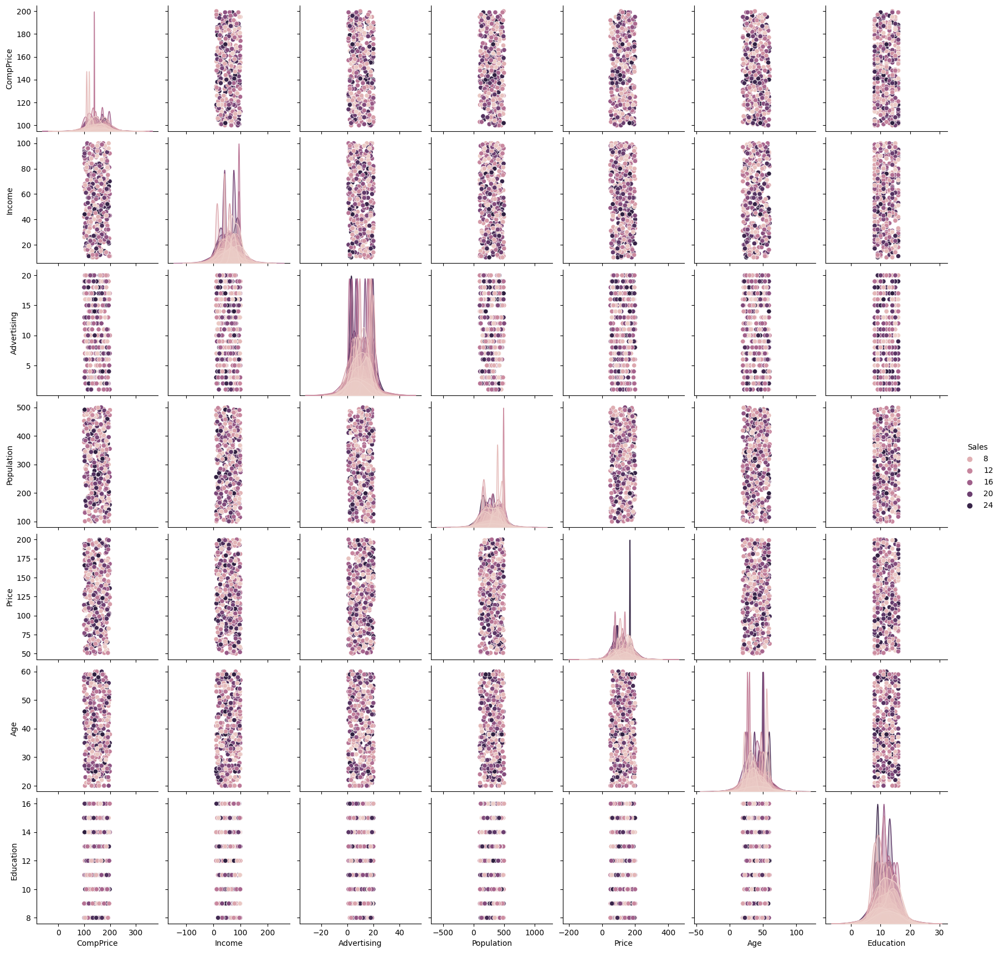

In [19]:
sns.pairplot(data=features, hue = 'Sales')

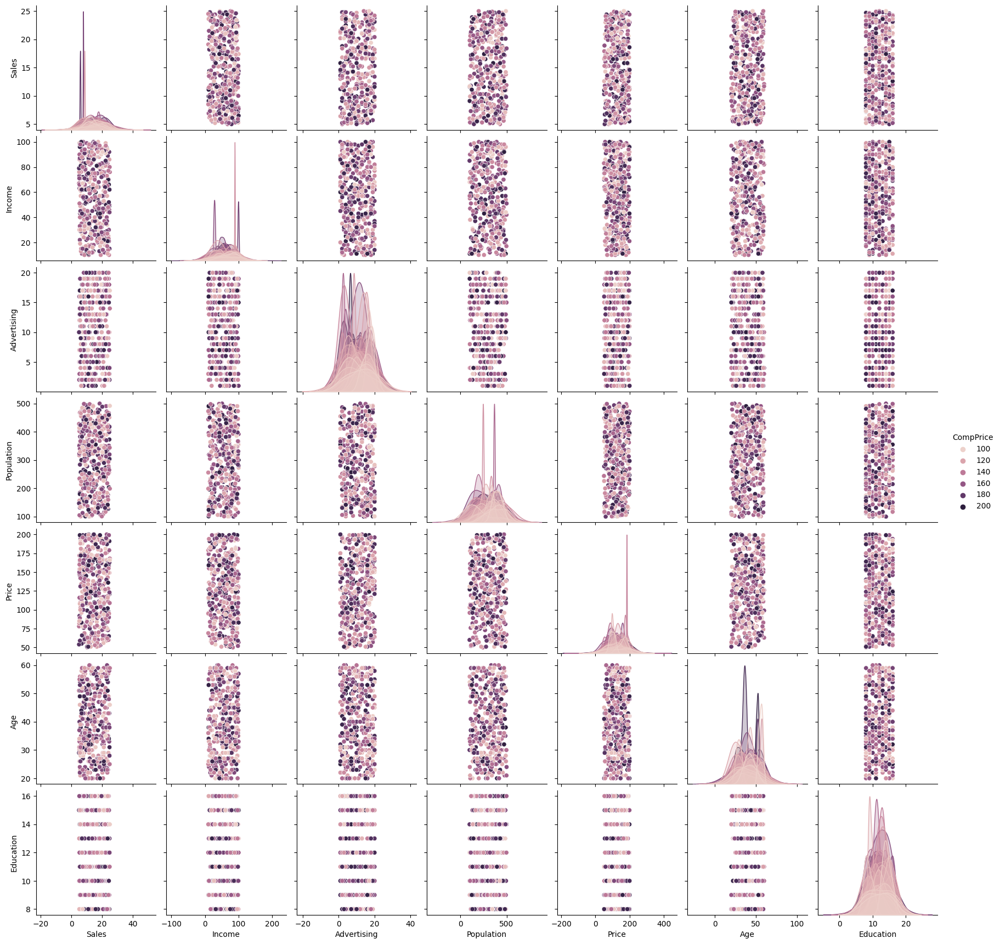

In [20]:
sns.pairplot(data=features, hue = 'CompPrice')

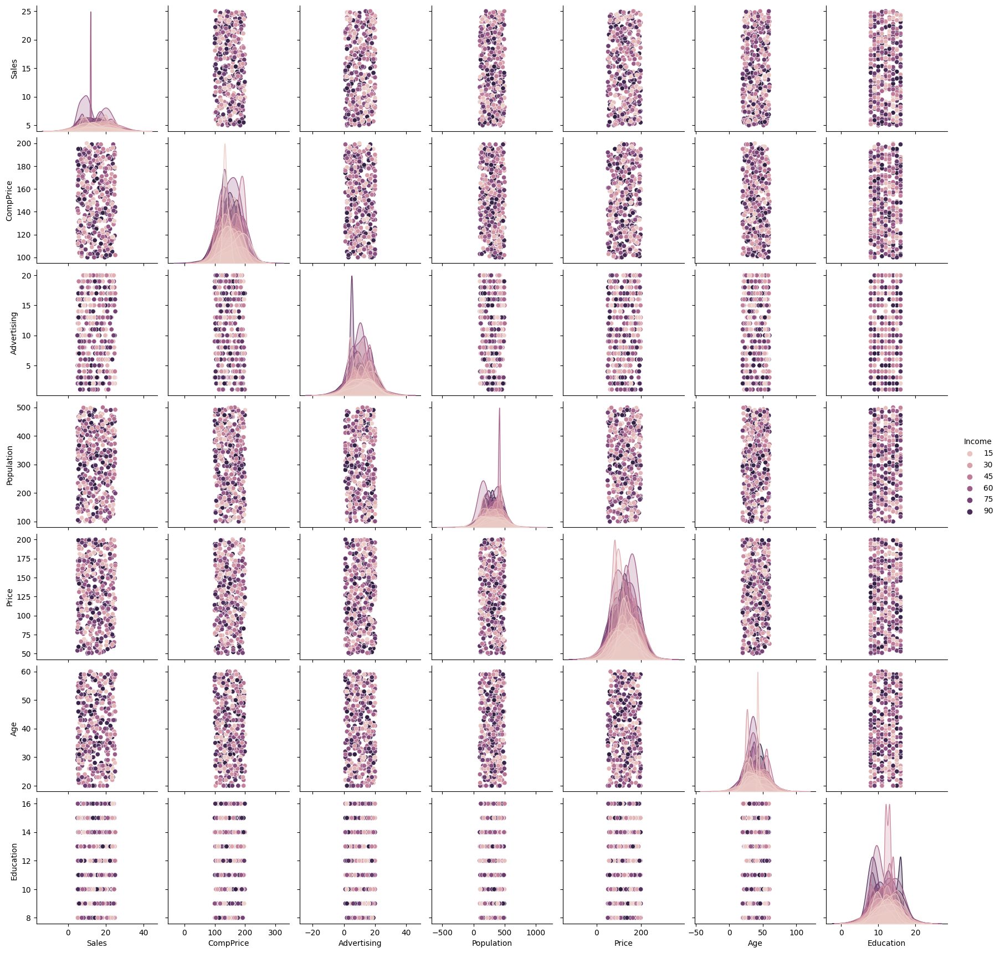

In [21]:
sns.pairplot(data=features, hue = 'Income')

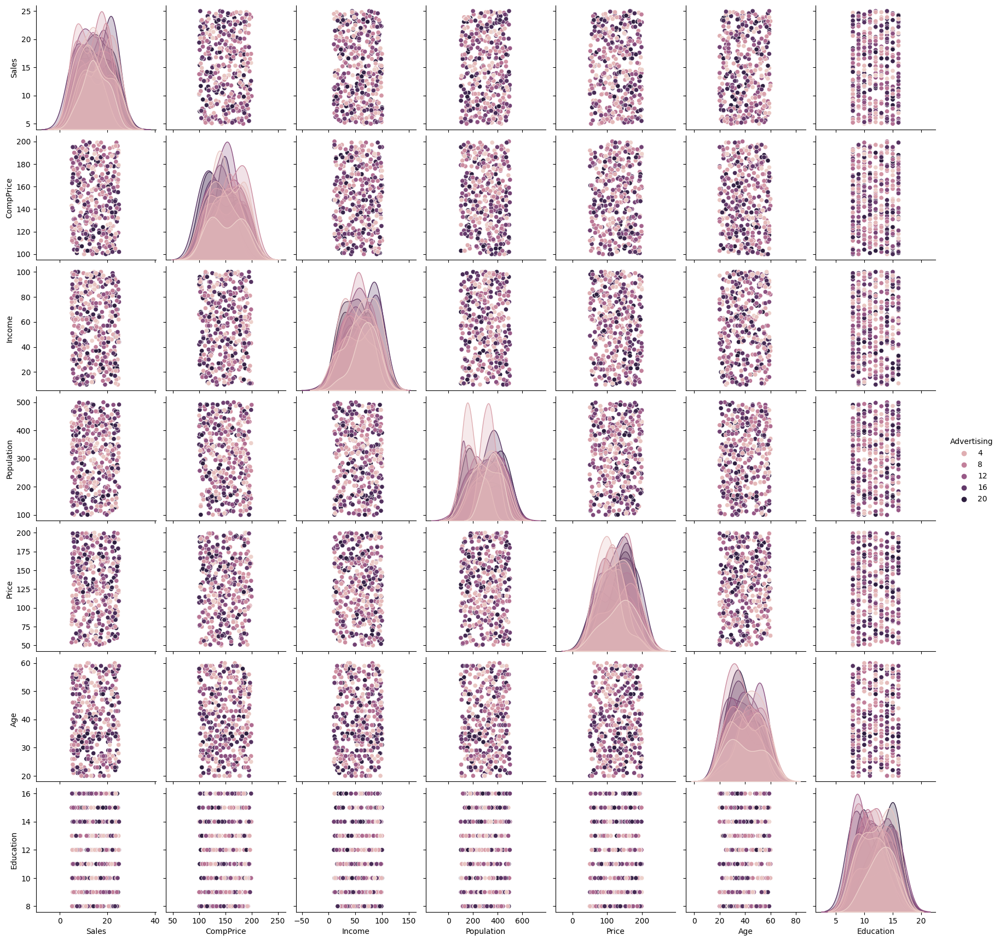

In [22]:
sns.pairplot(data=features, hue = 'Advertising')

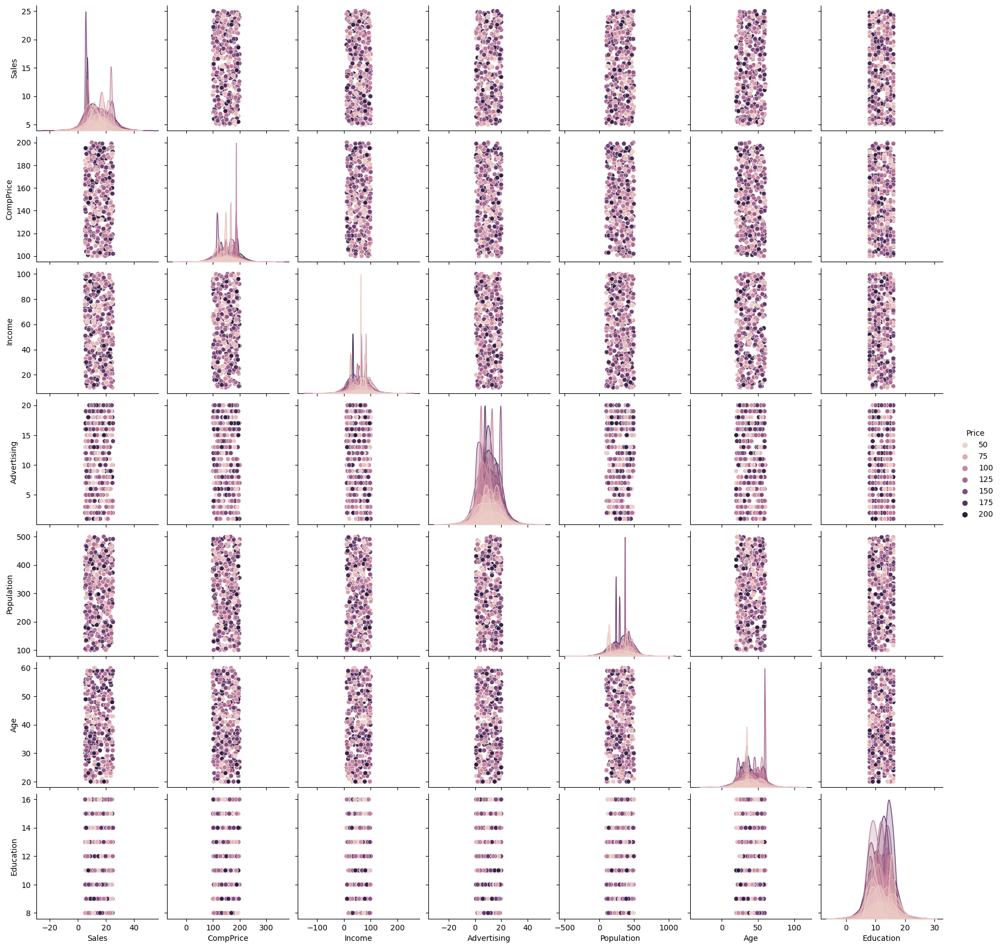

In [23]:
sns.pairplot(data=features, hue = 'Price')

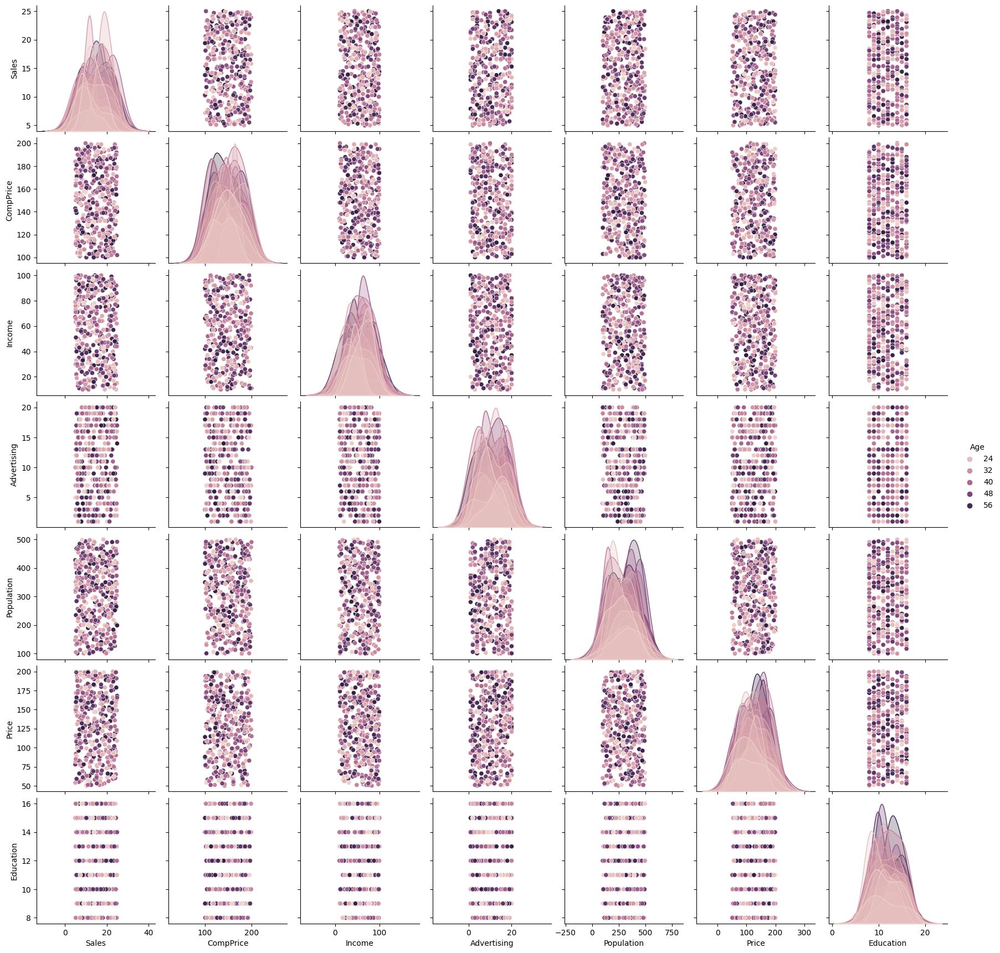

In [24]:
sns.pairplot(data=features, hue = 'Age')

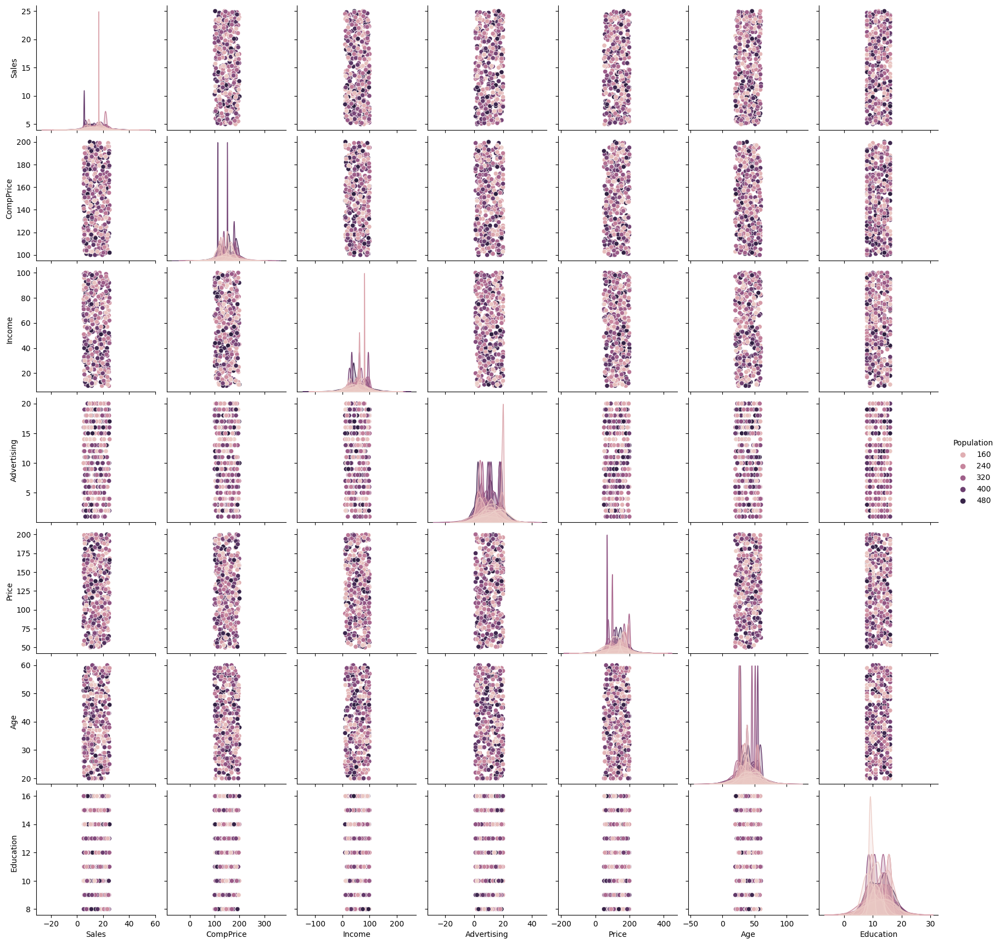

In [25]:
sns.pairplot(data =features, hue = 'Population')

In [8]:
df = pd.get_dummies(features, columns=['Urban','US'], drop_first=True)

In [9]:
print(df.head())

   Sales  CompPrice  Income  Advertising  Population  Price ShelveLoc  Age   
0   11.6        179      85           14         100     60      Good   30  \
1    5.3        140      63           12         402    172       Bad   31   
2   11.9        140      34           10         219    120       Bad   29   
3    7.2        101      26           19         473    188      Good   35   
4   18.4        155      22           19         391    154       Bad   25   

   Education  Urban_Yes  US_Yes  
0         14       True   False  
1         14      False   False  
2          9       True   False  
3         16      False    True  
4          8      False   False  


In [10]:
df['ShelveLoc'] = df['ShelveLoc'].map({'Good':1,'Medium':2,'Bad':3})

In [11]:
print(df.head())

   Sales  CompPrice  Income  Advertising  Population  Price  ShelveLoc  Age   
0   11.6        179      85           14         100     60          1   30  \
1    5.3        140      63           12         402    172          3   31   
2   11.9        140      34           10         219    120          3   29   
3    7.2        101      26           19         473    188          1   35   
4   18.4        155      22           19         391    154          3   25   

   Education  Urban_Yes  US_Yes  
0         14       True   False  
1         14      False   False  
2          9       True   False  
3         16      False    True  
4          8      False   False  


In [12]:
x=df.iloc[:,0:6]
y=df['ShelveLoc']
x

,Sales,CompPrice,Income,Advertising,Population,Price
0,11.6,179,85,14,100,60
1,5.3,140,63,12,402,172
2,11.9,140,34,10,219,120
3,7.2,101,26,19,473,188
4,18.4,155,22,19,391,154
...,...,...,...,...,...,...
395,5.7,118,19,12,329,154
396,18.4,118,57,13,183,110
397,9.1,158,78,6,419,192
398,11.5,133,12,13,388,194


In [13]:
y

0      1
1      3
2      3
3      1
4      3
      ..
395    3
396    1
397    3
398    1
399    2
Name: ShelveLoc, Length: 400, dtype: int64

In [14]:
df['ShelveLoc'].unique()

array([1, 3, 2], dtype=int64)

In [15]:
df.Sales.value_counts()

Sales
5.3     7
9.1     6
18.4    6
15.2    6
16.6    6
       ..
22.1    1
18.0    1
19.3    1
17.7    1
7.4     1
Name: count, Length: 174, dtype: int64

In [16]:
colnames = list(df.columns)
colnames

['Sales',
 'CompPrice',
 'Income',
 'Advertising',
 'Population',
 'Price',
 'ShelveLoc',
 'Age',
 'Education',
 'Urban_Yes',
 'US_Yes']

In [17]:
rows = list(df.index)[0:10]
rows

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [18]:
print('The second row information \n')
print(df.loc[2])

The second row information 

Sales           11.9
CompPrice        140
Income            34
Advertising       10
Population       219
Price            120
ShelveLoc          3
Age               29
Education          9
Urban_Yes       True
US_Yes         False
Name: 2, dtype: object


In [19]:
df.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education
count,400.000000,400.000000,400.000000,400.00000,400.000000,400.000000,400.000000,400.00000,400.000000
mean,14.684000,148.682500,57.190000,10.62500,303.280000,126.765000,1.965000,39.64750,11.850000
std,6.028482,28.629807,26.523152,5.80462,115.230799,42.395675,0.836975,11.58312,2.647645
min,5.000000,100.000000,10.000000,1.00000,100.000000,50.000000,1.000000,20.00000,8.000000
25%,9.100000,123.750000,34.000000,6.00000,200.000000,91.750000,1.000000,30.00000,9.000000
50%,14.350000,148.000000,59.000000,10.00000,316.000000,127.000000,2.000000,39.00000,12.000000
75%,20.100000,174.000000,81.000000,16.00000,404.000000,162.000000,3.000000,50.00000,14.000000
max,25.000000,200.000000,100.000000,20.00000,500.000000,200.000000,3.000000,60.00000,16.000000


In [20]:
df.head

<bound method NDFrame.head of      Sales  CompPrice  Income  Advertising  Population  Price  ShelveLoc  Age   
0     11.6        179      85           14         100     60          1   30  \
1      5.3        140      63           12         402    172          3   31   
2     11.9        140      34           10         219    120          3   29   
3      7.2        101      26           19         473    188          1   35   
4     18.4        155      22           19         391    154          3   25   
..     ...        ...     ...          ...         ...    ...        ...  ...   
395    5.7        118      19           12         329    154          3   29   
396   18.4        118      57           13         183    110          1   27   
397    9.1        158      78            6         419    192          3   20   
398   11.5        133      12           13         388    194          1   30   
399    7.4        147      80           18         177    196          2   23  

In [21]:
labels = np.array(df['ShelveLoc'])
features = df.drop('ShelveLoc', axis = 1)
feature_list = list(df.columns)
features = np.array(df)

In [22]:
from sklearn.model_selection import train_test_split
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25, random_state = 42)

In [23]:
print('Training Features Shape:', train_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Features Shape:', test_features.shape)
print('Testing Labels Shape:', test_labels.shape)

Training Features Shape: (300, 11)
Training Labels Shape: (300,)
Testing Features Shape: (100, 11)
Testing Labels Shape: (100,)


In [24]:
baseline_preds = test_features[:, feature_list.index('Sales')]
baseline_errors = abs(baseline_preds - test_labels)
print('Average baseline error: ', round(np.mean(baseline_errors), 2))

Average baseline error:  12.02


In [25]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 1000, random_state = 0)
rf.fit(train_features, train_labels);

In [26]:
predictions = rf.predict(test_features)
errors = abs(predictions - test_labels)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

Mean Absolute Error: 0.0 degrees.


In [27]:
mape = 100 * (errors / test_labels)
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 100.0 %.


In [29]:
from sklearn.tree import export_graphviz
import pydot
tree = rf.estimators_[5]
from sklearn.tree import export_graphviz
import pydot
tree = rf.estimators_[5]
export_graphviz(tree, out_file = 'tree.dot', feature_names = feature_list, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

In [30]:
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(train_features, train_labels)
tree_small = rf_small.estimators_[5]
export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = feature_list, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')
graph.write_png('small_tree.png');

In [31]:
importances = list(rf.feature_importances_)
feature_importances = [(feature, round(importance, 5)) for feature, importance in zip(feature_list, importances)]
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = False)
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: Sales                Importance: 0.0
Variable: CompPrice            Importance: 0.0
Variable: Income               Importance: 0.0
Variable: Advertising          Importance: 0.0
Variable: Population           Importance: 0.0
Variable: Price                Importance: 0.0
Variable: Age                  Importance: 0.0
Variable: Education            Importance: 0.0
Variable: Urban_Yes            Importance: 0.0
Variable: US_Yes               Importance: 0.0
Variable: ShelveLoc            Importance: 1.0


In [32]:
rf_most_important = RandomForestRegressor(n_estimators= 1000, random_state=22)
important_indices = [feature_list.index('Income'), feature_list.index('Price')]
train_important = train_features[:, important_indices]
test_important = test_features[:, important_indices]
rf_most_important.fit(train_important, train_labels)
predictions = rf_most_important.predict(test_important)
errors = abs(predictions - test_labels)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
mape = np.mean(100 * (errors / test_labels))
accuracy = 100 - mape
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.76 degrees.
Accuracy: 50.4 %.


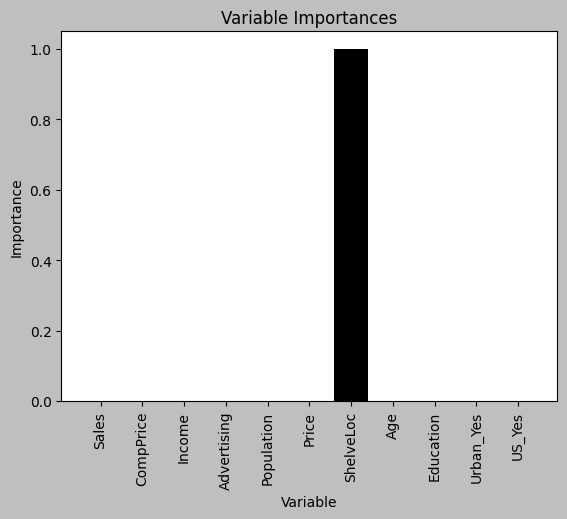

In [34]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('grayscale')
x_values = list(range(len(importances)))
plt.bar(x_values, importances, orientation = 'vertical')
plt.xticks(x_values, feature_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

In [35]:

labels = np.array(df['Income'])
features= df.drop('Income', axis = 1)
feature_list = list(df.columns)
features = np.array(df)

In [36]:
from sklearn.model_selection import train_test_split
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25, random_state = 42)

In [37]:
print('Training Features Shape:', train_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Features Shape:', test_features.shape)
print('Testing Labels Shape:', test_labels.shape)

Training Features Shape: (300, 11)
Training Labels Shape: (300,)
Testing Features Shape: (100, 11)
Testing Labels Shape: (100,)


In [38]:
baseline_preds = test_features[:, feature_list.index('Sales')]
baseline_errors = abs(baseline_preds - test_labels)
print('Average baseline error: ', round(np.mean(baseline_errors), 2))

Average baseline error:  42.57


In [39]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
rf.fit(train_features, train_labels);

In [40]:
predictions = rf.predict(test_features)
errors = abs(predictions - test_labels)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

Mean Absolute Error: 0.15 degrees.


In [41]:
mape = 100 * (errors / test_labels)
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 99.48 %.


In [42]:
from sklearn.tree import export_graphviz
import pydot
tree = rf.estimators_[5]
from sklearn.tree import export_graphviz
import pydot
tree = rf.estimators_[5]
export_graphviz(tree, out_file = 'tree.dot', feature_names = feature_list, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

In [43]:
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(train_features, train_labels)
tree_small = rf_small.estimators_[5]
export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = feature_list, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')
graph.write_png('small_tree.png');

In [44]:
importances = list(rf.feature_importances_)
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: Income               Importance: 1.0
Variable: Sales                Importance: 0.0
Variable: CompPrice            Importance: 0.0
Variable: Advertising          Importance: 0.0
Variable: Population           Importance: 0.0
Variable: Price                Importance: 0.0
Variable: ShelveLoc            Importance: 0.0
Variable: Age                  Importance: 0.0
Variable: Education            Importance: 0.0
Variable: Urban_Yes            Importance: 0.0
Variable: US_Yes               Importance: 0.0


In [45]:
rf_most_important = RandomForestRegressor(n_estimators= 1000, random_state=42)
important_indices = [feature_list.index('Sales'), feature_list.index('Income')]
train_important = train_features[:, important_indices]
test_important = test_features[:, important_indices]
rf_most_important.fit(train_important, train_labels)
predictions = rf_most_important.predict(test_important)
errors = abs(predictions - test_labels)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
mape = np.mean(100 * (errors / test_labels))
accuracy = 100 - mape
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.1 degrees.
Accuracy: 99.67 %.


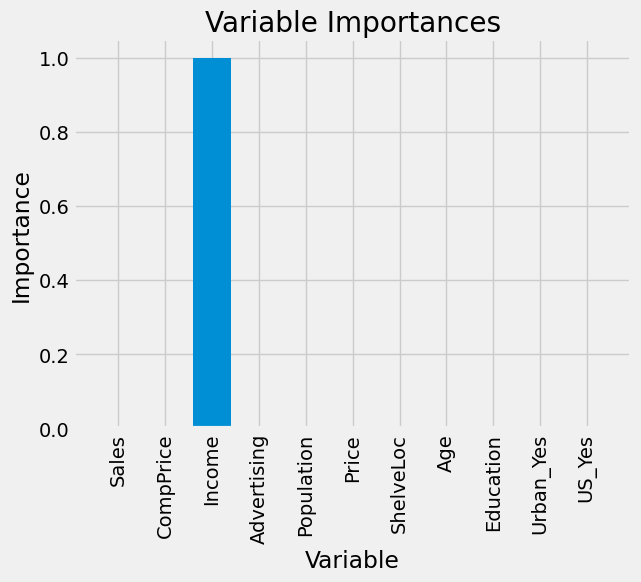

In [46]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
x_values = list(range(len(importances)))
plt.bar(x_values, importances, orientation = 'vertical')
plt.xticks(x_values, feature_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');